In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
data = pd.read_excel('Final_SWATData.xlsx')


In [5]:
data.head()

,Timestamp,FIT101,LIT101,MV101,P101,P102,AIT201,AIT202,AIT203,FIT201,...,P501,P502,PIT501,PIT502,PIT503,FIT601,P601,P602,P603,Normal/Attack
0,22/12/2015 4:00:00 PM,2.470294,261.5804,2,2,1,244.3284,8.19008,306.101,2.471278,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
1,22/12/2015 4:00:01 PM,2.457163,261.1879,2,2,1,244.3284,8.19008,306.101,2.468587,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
2,22/12/2015 4:00:02 PM,2.439548,260.9131,2,2,1,244.3284,8.19008,306.101,2.467305,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
3,22/12/2015 4:00:03 PM,2.428338,260.2850,2,2,1,244.3284,8.19008,306.101,2.466536,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal
4,22/12/2015 4:00:04 PM,2.424815,259.8925,2,2,1,244.4245,8.19008,306.101,2.466536,...,1,1,10.02948,0.0,4.277749,0.000256,1,1,1,Normal


In [6]:
data.columns

Index([' Timestamp', 'FIT101', 'LIT101', 'MV101', 'P101', 'P102', 'AIT201',
       'AIT202', 'AIT203', 'FIT201', 'MV201', 'P201', 'P202', 'P203', 'P204',
       'P205', 'P206', 'DPIT301', 'FIT301', 'LIT301', 'MV301', 'MV302',
       'MV303', 'MV304', 'P301', 'P302', 'AIT401', 'AIT402', 'FIT401',
       'LIT401', 'P401', 'P402', 'P403', 'P404', 'UV401', 'AIT501', 'AIT502',
       'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504', 'P501',
       'P502', 'PIT501', 'PIT502', 'PIT503', 'FIT601', 'P601', 'P602', 'P603',
       'Normal/Attack'],
      dtype='object')

labelling the Normal as 0 and attack as 1

In [7]:
data['Normal/Attack'] = data['Normal/Attack'].replace({'Normal': 0, 'Attack': 1})


In [8]:
import warnings
warnings.filterwarnings('ignore')

list of sensors and actuators

In [ ]:
# No.Name Type Description
# 1 FIT-101 Sensor Flow meter; Measures inflow into raw water tank.
# 2 LIT-101 Sensor Level Transmitter; Raw water tank level.
# 3 MV-101 Actuator Motorized valve; Controls water flow to the raw water tank.
# 4 P-101 Actuator Pump; Pumps water from raw water tank to second stage.
# 5 P-102 (backup) Actuator Pump; Pumps water from raw water tank to second stage.
# 6 AIT-201 Sensor Conductivity analyser; Measures NaCl level.
# 7 AIT-202 Sensor pH analyser; Measures HCl level.
# 8 AIT-203 Sensor ORP analyser; Measures NaOCl level.
# 9 FIT-201 Sensor Flow Transmitter; Control dosing pumps.
# 10 MV-201 Actuator Motorized valve; Controls water flow to the UF feed water tank.
# 11 P-201 Actuator Dosing pump; NaCl dosing pump.
# 12 P-202 (backup) Actuator Dosing pump; NaCl dosing pump.
# 13 P-203 Actuator Dosing pump; HCl dosing pump.
# 14 P-204 (backup) Actuator Dosing pump; HCl dosing pump.
# 15 P-205 Actuator Dosing pump; NaOCl dosing pump.
# 16 P-206 (backup) Actuator Dosing pump; NaOCl dosing pump.
# 17 DPIT-301 Sensor Differential pressure indicating transmitter; Controls the backwash process.
# 18 FIT-301 Sensor Flow meter; Measures the flow of water in the UF stage.
# 19 LIT-301 Sensor Level Transmitter; UF feed water tank level.
# 20 MV-301 Actuator Motorized Valve; Controls UF-Backwash process.
# 21 MV-302 Actuator Motorized Valve; Controls water from UF process to DeChlorination unit.
# 22 MV-303 Actuator Motorized Valve; Controls UF-Backwash drain.
# 23 MV-304 Actuator Motorized Valve; Controls UF drain.
# 24 P-301 (backup) Actuator UF feed Pump; Pumps water from UF feed water tank to RO
# feed water tank via UF filtration.
# 25 P-302 Actuator UF feed Pump; Pumps water from UF feed water tank to RO
# feed water tank via UF filtration.
# 26 AIT-401 Sensor RO hardness meter of water.
# 27 AIT-402 Sensor ORP meter; Controls the NaHSO3dosing(P203), NaOCl dosing
# (P205).
# 28 FIT-401 Sensor Flow Transmitter ; Controls the UV dechlorinator.
# 29 LIT-401 Actuator Level Transmitter; RO feed water tank level.
# 30 P-401 (backup) Actuator Pump; Pumps water from RO feed tank to UV dechlorinator.
# 31 P-402 Actuator Pump; Pumps water from RO feed tank to UV dechlorinator.
# 32 P-403 Actuator Sodium bi-sulphate pump.
# 33 P-404 (backup) Actuator Sodium bi-sulphate pump.
# 34 UV-401 Actuator Dechlorinator; Removes chlorine from water.
# 35 AIT-501 Sensor RO pH analyser; Measures HCl level.
# 36 AIT-502 Sensor RO feed ORP analyser; Measures NaOCl level.
# 37 AIT-503 Sensor RO feed conductivity analyser; Measures NaCl level.
# 38 AIT-504 Sensor RO permeate conductivity analyser; Measures NaCl level.
# 39 FIT-501 Sensor Flow meter; RO membrane inlet flow meter.
# 40 FIT-502 Sensor Flow meter; RO Permeate flow meter.
# 41 FIT-503 Sensor Flow meter; RO Reject flow meter.
# 42 FIT-504 Sensor Flow meter; RO re-circulation flow meter.
# 43 P-501 Actuator Pump; Pumps dechlorinated water to RO.
# 44 P-502 (backup) Actuator Pump; Pumps dechlorinated water to RO.
# 45 PIT-501 Sensor Pressure meter; RO feed pressure.
# 46 PIT-502 Sensor Pressure meter; RO permeate pressure.
# 47 PIT-503 Sensor Pressure meter;RO reject pressure.
# 48 FIT-601 Sensor Flow meter; UF Backwash flow meter.
# 49 P-601 Actuator Pump; Pumps water from RO permeate tank to raw water tank
# (not used for data collection).
# 50 P-602 Actuator Pump; Pumps water from UF back wash tank to UF filter to
# clean the membrane.
# 51 P-603 Actuator Not implemented in SWaT yet

In [31]:
sensors = ['FIT101',
'LIT101' ,
'AIT201',
'AIT202',
'AIT203',
'FIT201',
'DPIT301',
'FIT301',
'LIT301',
'AIT401',
'AIT402',
'FIT401',
'AIT501',
'AIT502',
'AIT503',
'AIT504',
'FIT501',
'FIT502',
'FIT503',
'FIT504',
'PIT501',
'PIT502',
'PIT503',
'FIT601'
]

In [116]:
#combining to prevent error:

df = data

#only checking the sensor data
columns_to_keep = [' Timestamp', 'FIT101', 'LIT101', 'AIT201', 'AIT202', 'AIT203', 'FIT201', 'DPIT301',
                   'FIT301', 'LIT301', 'AIT401', 'AIT402', 'FIT401', 'AIT501', 'AIT502', 'AIT503',
                   'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504', 'PIT501', 'PIT502', 'PIT503',
                   'FIT601', 'Normal/Attack']

df = df[columns_to_keep]


df.head()

#rename the Normal/Attack as Target label
df.rename(columns={'Normal/Attack': 'Target'}, inplace=True)

df.rename(columns={' Timestamp': 'Timestamp'}, inplace=True)

# Remove the leading space from the timestamp string
df['Timestamp'] = df['Timestamp'].str.strip()
#to plot the data set the column 'Timestamp' as index and covert it to datetime format
df['Timestamp'] = pd.to_datetime(df['Timestamp'], format='%d/%m/%Y %I:%M:%S %p')



In [117]:
df.head()

,Timestamp,FIT101,LIT101,AIT201,AIT202,AIT203,FIT201,DPIT301,FIT301,LIT301,...,AIT504,FIT501,FIT502,FIT503,FIT504,PIT501,PIT502,PIT503,FIT601,Target
0,2015-12-22 16:00:00,2.470294,261.5804,244.3284,8.19008,306.101,2.471278,20.79839,2.235275,327.4401,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
1,2015-12-22 16:00:01,2.457163,261.1879,244.3284,8.19008,306.101,2.468587,20.79839,2.234507,327.4401,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2,2015-12-22 16:00:02,2.439548,260.9131,244.3284,8.19008,306.101,2.467305,20.84320,2.233354,327.4401,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
3,2015-12-22 16:00:03,2.428338,260.2850,244.3284,8.19008,306.101,2.466536,20.84320,2.233354,327.2799,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
4,2015-12-22 16:00:04,2.424815,259.8925,244.4245,8.19008,306.101,2.466536,20.84320,2.233354,327.1597,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0


In [118]:
#fill the null values by 0
df.fillna(0, inplace=True)

In [115]:
#df.to_csv('preprocessed_data.csv', index=False)


In [119]:

    # Set 'Timestamp' as the index
df.set_index('Timestamp', inplace=True)

In [123]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 946719 entries, 2015-12-22 16:00:00 to 2016-01-02 14:59:59
Data columns (total 25 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   FIT101   946719 non-null  float64
 1   LIT101   946719 non-null  float64
 2   AIT201   946719 non-null  float64
 3   AIT202   946719 non-null  float64
 4   AIT203   946719 non-null  float64
 5   FIT201   946719 non-null  float64
 6   DPIT301  946719 non-null  float64
 7   FIT301   946719 non-null  float64
 8   LIT301   946719 non-null  float64
 9   AIT401   946719 non-null  float64
 10  AIT402   946719 non-null  float64
 11  FIT401   946719 non-null  float64
 12  AIT501   946719 non-null  float64
 13  AIT502   946719 non-null  float64
 14  AIT503   946719 non-null  float64
 15  AIT504   946719 non-null  float64
 16  FIT501   946719 non-null  float64
 17  FIT502   946719 non-null  float64
 18  FIT503   946719 non-null  float64
 19  FIT504   946719 non-null  float

In [120]:
df.head()

,FIT101,LIT101,AIT201,AIT202,AIT203,FIT201,DPIT301,FIT301,LIT301,AIT401,...,AIT504,FIT501,FIT502,FIT503,FIT504,PIT501,PIT502,PIT503,FIT601,Target
Timestamp,,,,,,,,,,,,,,,,,,,,,
2015-12-22 16:00:00,2.470294,261.5804,244.3284,8.19008,306.101,2.471278,20.79839,2.235275,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:01,2.457163,261.1879,244.3284,8.19008,306.101,2.468587,20.79839,2.234507,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:02,2.439548,260.9131,244.3284,8.19008,306.101,2.467305,20.84320,2.233354,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:03,2.428338,260.2850,244.3284,8.19008,306.101,2.466536,20.84320,2.233354,327.2799,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:04,2.424815,259.8925,244.4245,8.19008,306.101,2.466536,20.84320,2.233354,327.1597,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0


In [121]:
def resample_function_plot(dataframe, field, frequency):


    # Resample the data to the frequency
    resampled_dataframe = dataframe.resample(frequency).mean()

    # Plot the time series graph
    plt.figure(figsize=(12, 6))
    plt.plot(resampled_dataframe.index, resampled_dataframe[field])
    plt.xlabel('Timestamp')
    plt.ylabel(field)
    plt.title(f'Resampled Time Series Plot of {field} ({frequency} Frequency)')
    plt.show()

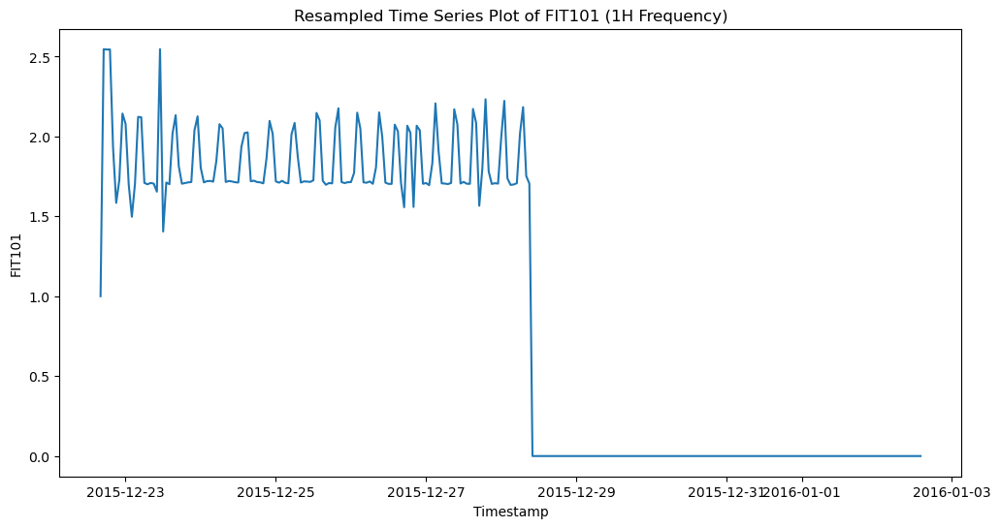

In [122]:
resample_function_plot(df, 'FIT101', '1H')

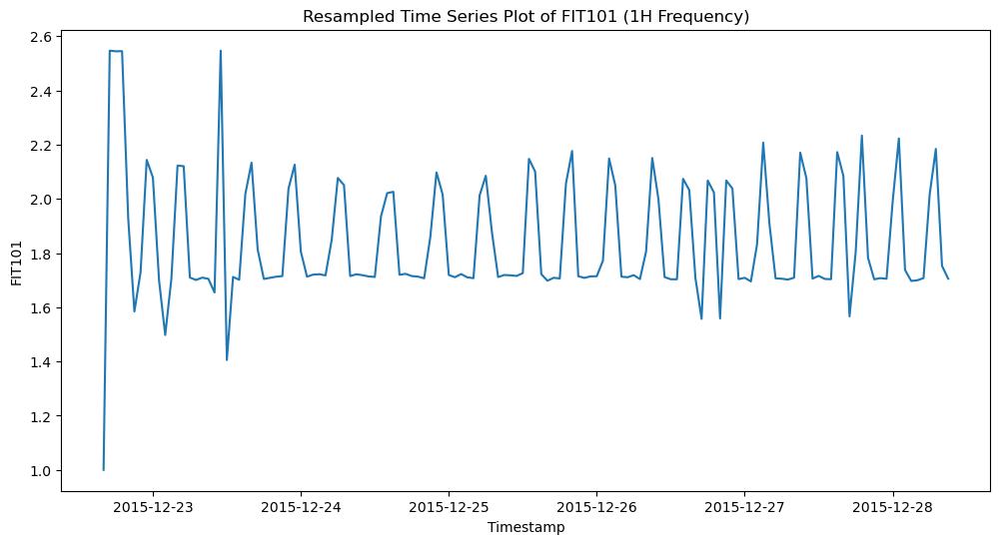

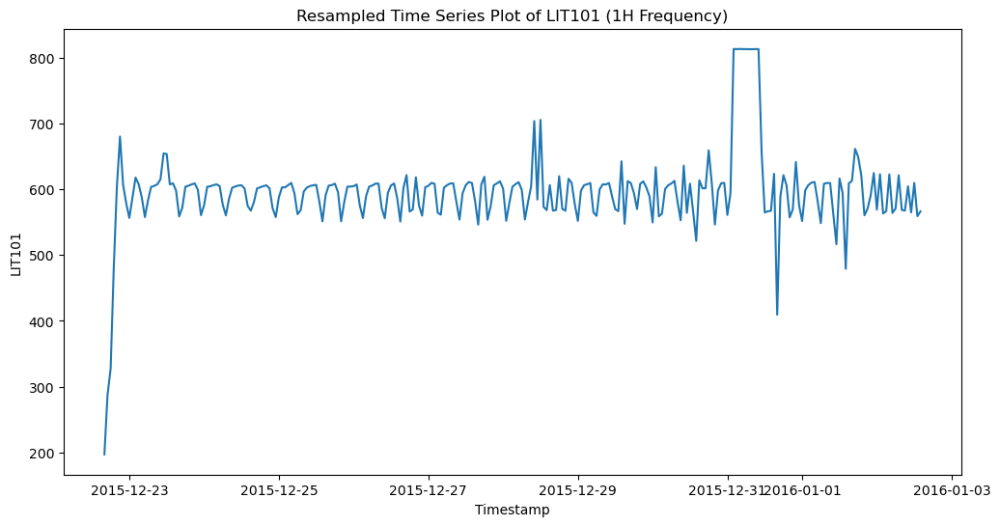

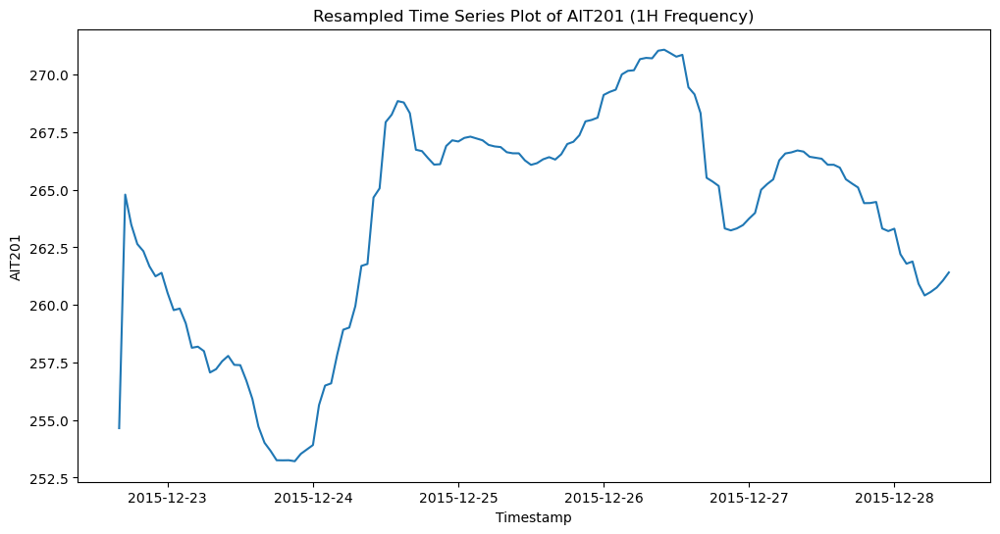

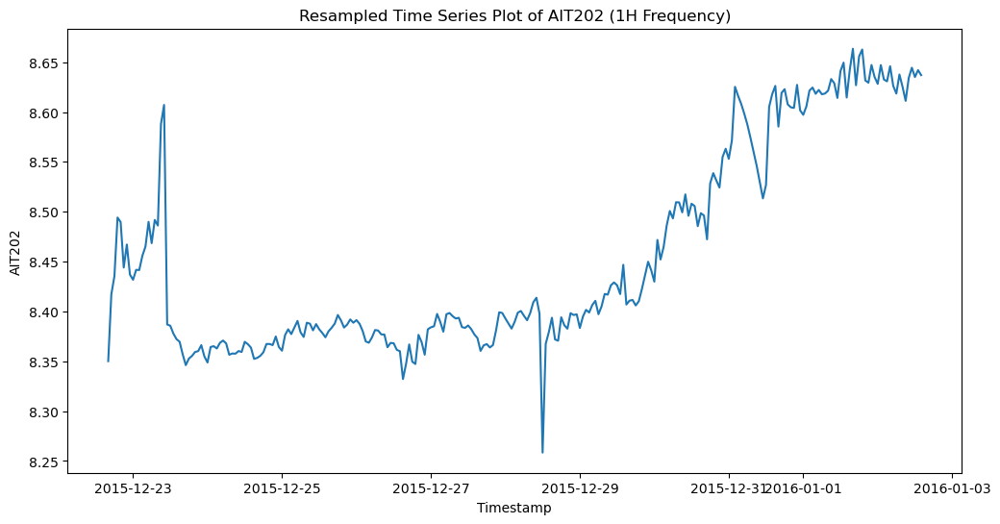

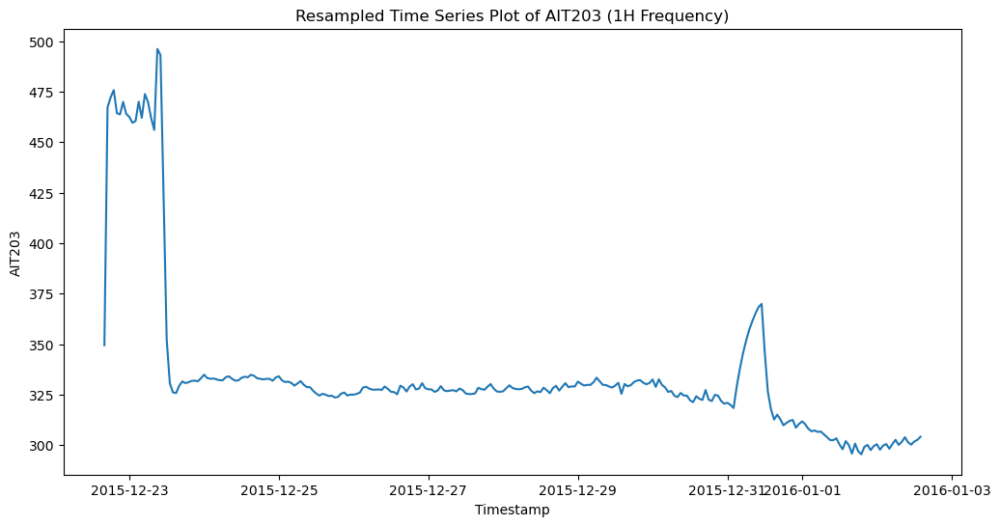

...

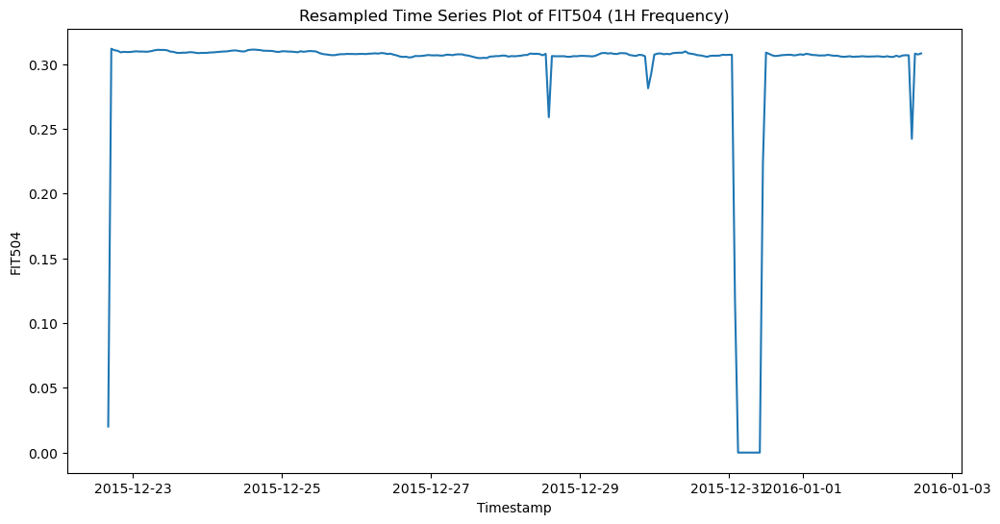

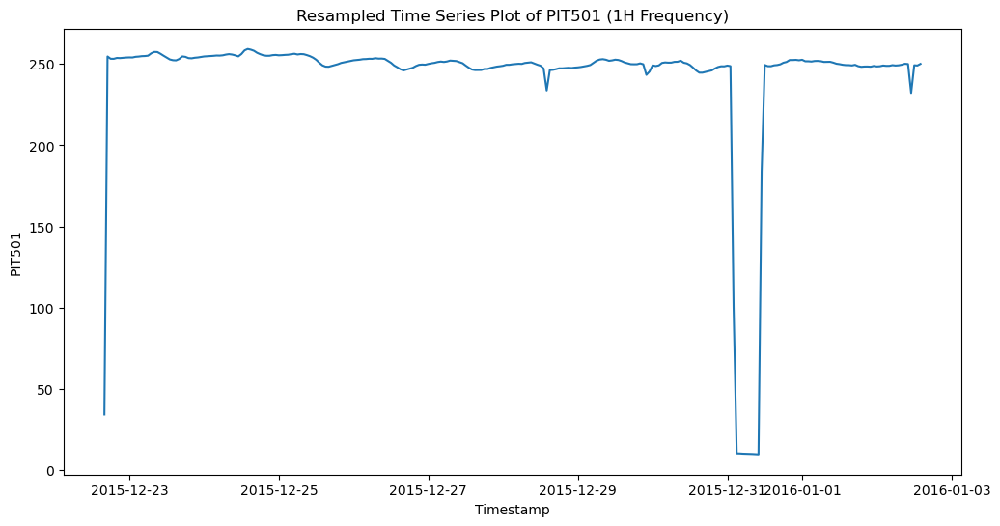

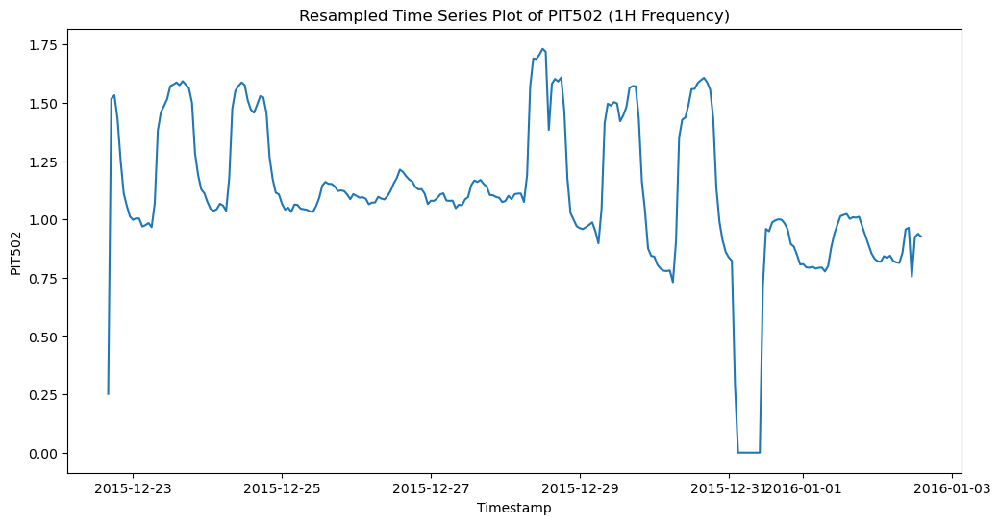

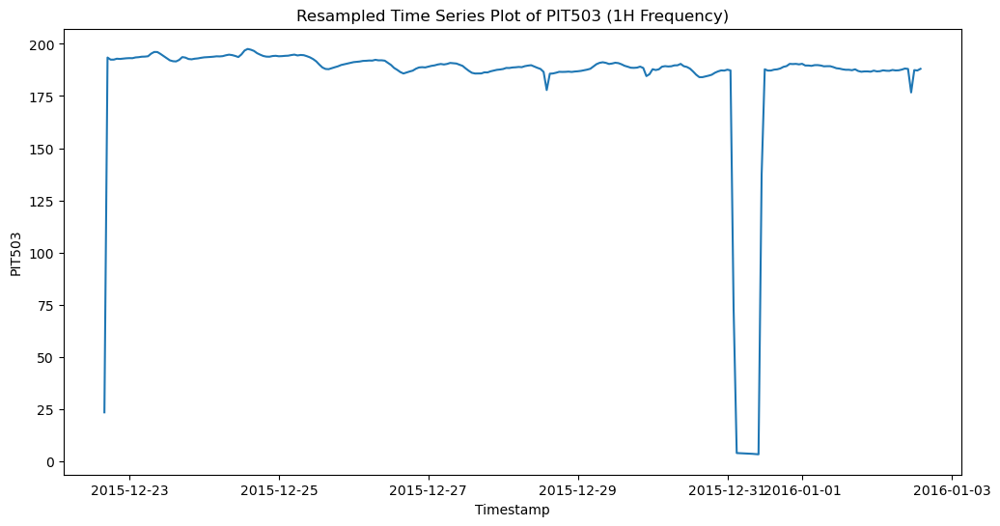

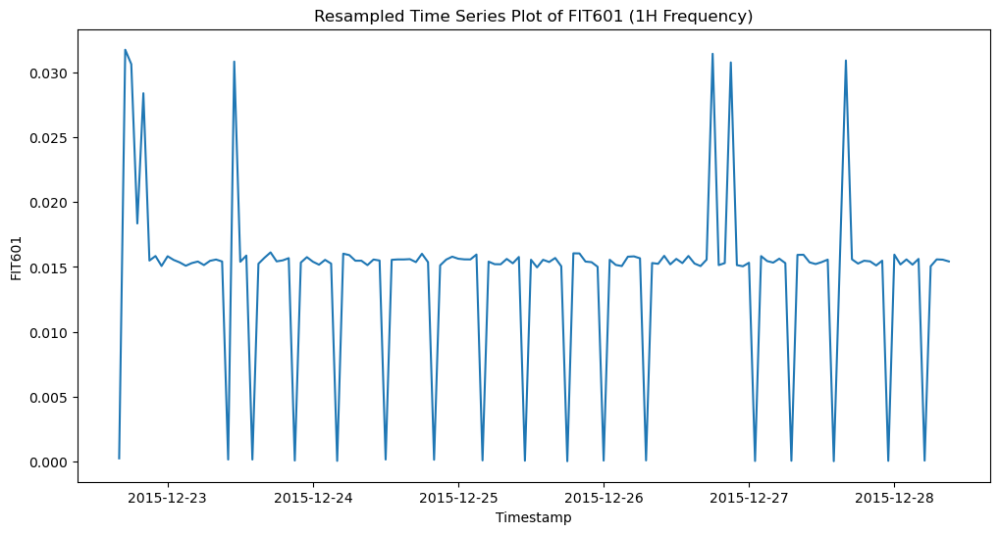

In [16]:
for sensors in sensors:
    resample_function_plot(df, sensors, '1H')

In [1]:
import plotly.express as px

def resample_function_plotly(dataframe, field, frequency):
    # Resample the data to the specified frequency
    resampled_dataframe = dataframe.resample(frequency).mean()

    # Create the plotly figure
    fig = px.line(resampled_dataframe, x=resampled_dataframe.index, y=field, labels={'index': 'Timestamp', field: field},
                  title=f'Resampled Time Series Plot of {field} ({frequency} Frequency)')

    # Enable hover tooltips and zooming
    fig.update_layout(hovermode='x', xaxis=dict(rangeselector=dict(buttons=[dict(count=1, label='1d', step='day', stepmode='backward'),
                                                                             dict(count=7, label='1w', step='day', stepmode='backward'),
                                                                             dict(count=1, label='1m', step='month', stepmode='backward'),
                                                                             dict(count=3, label='3m', step='month', stepmode='backward'),
                                                                             dict(step='all')])),
                      xaxis_rangeslider_visible=True)

    # Display the plot
    fig.show()


In [14]:
resample_function_plotly(df, 'FIT101', '1H')

In [43]:
#full plot check
def function_plot(dataframe, field):


    resampled_dataframe = dataframe

    # Plot the time series graph
    plt.figure(figsize=(24,8))
    plt.plot(resampled_dataframe.index, resampled_dataframe[field])
    plt.xlabel('Timestamp')
    plt.ylabel(field)
    plt.title(f'Without resampling Time Series Plot of {field}')
    plt.show()

In [42]:
#trying without resampling and marking the areas with attack and normal
def target_function_plot(dataframe, field):
    # Filter the dataframe based on 'Target' values
    target_0 = dataframe[dataframe['Target'] == 0]
    target_1 = dataframe[dataframe['Target'] == 1]

    # Plot the time series graph
    plt.figure(figsize=(24, 8))
    plt.plot(target_0.index, target_0[field], color='green', label='Target 0: Normal')
    plt.plot(target_1.index, target_1[field], color='red', label='Target 1: Attack')
    plt.xlabel('Timestamp')
    plt.ylabel(field)
    plt.title(f'Without Resampling Attack/Normal Legend Time Series Plot of {field}')
    plt.legend()
    plt.show()


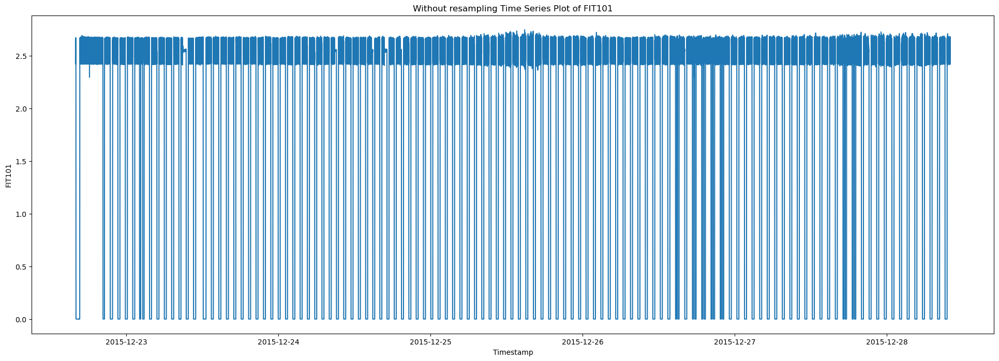

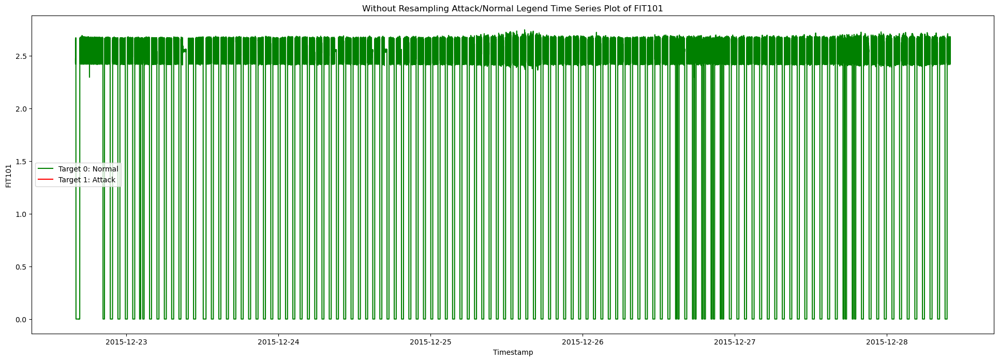

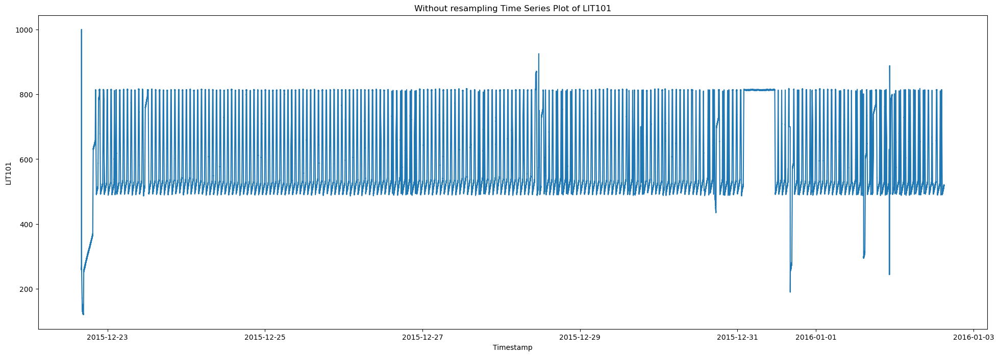

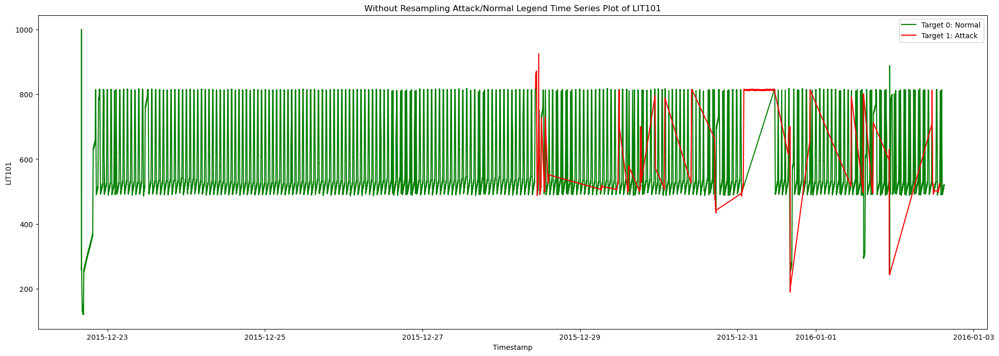

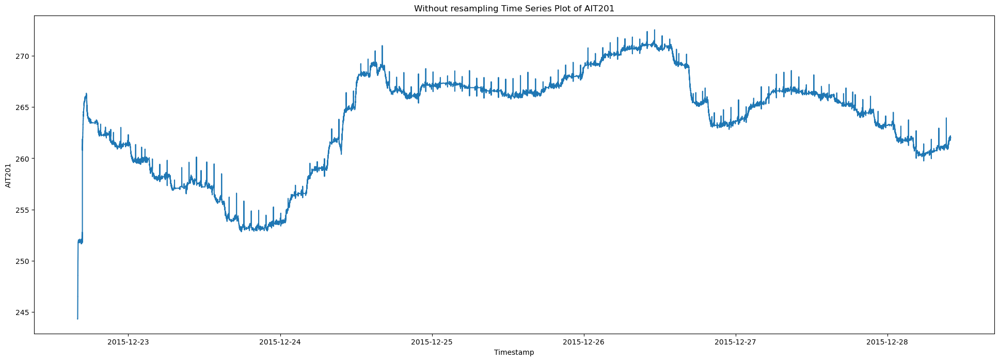

...

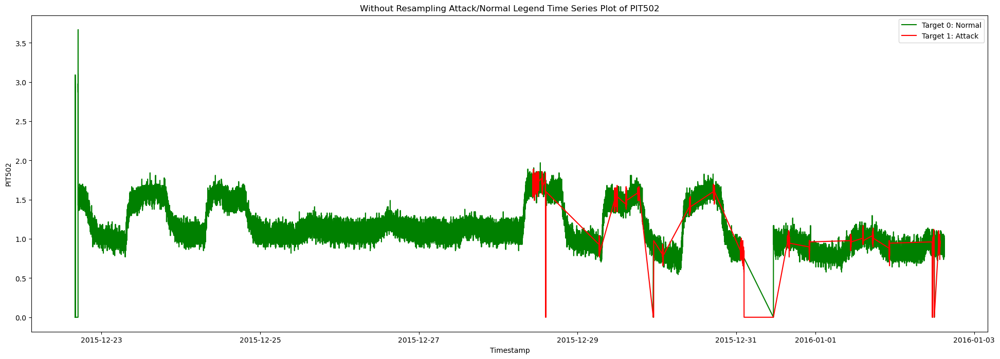

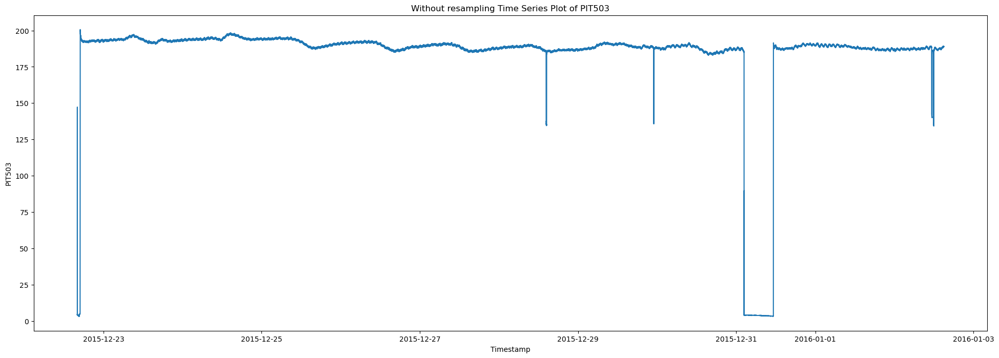

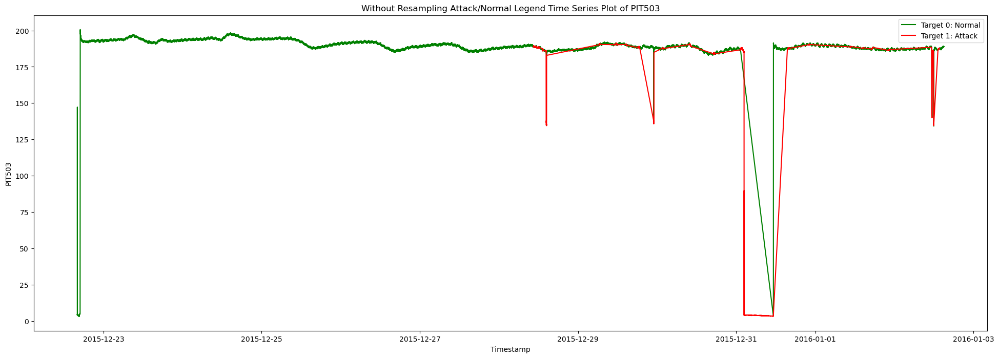

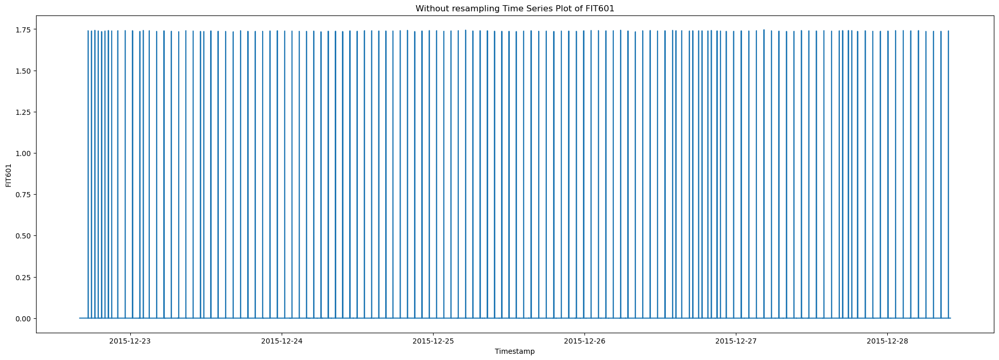

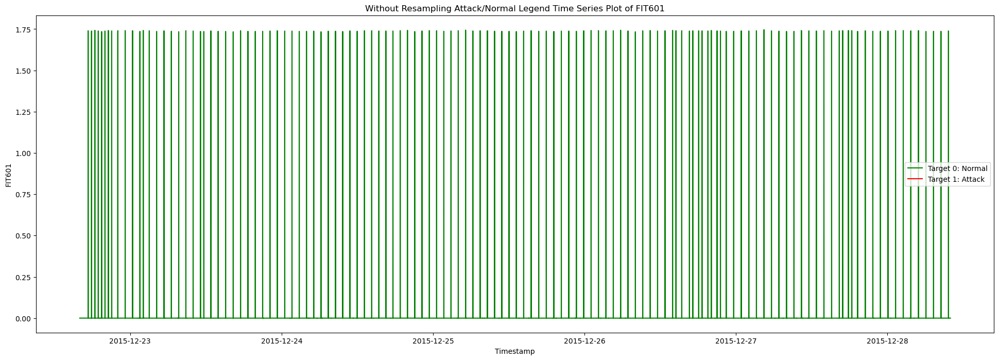

In [44]:
for i in sensors:
    function_plot(df, i)
    target_function_plot(df, i)

coming from the data itself it can be cleared that the only sensor values which are correlated with th target values are :
sensors :
PIT503
PIT502
PIT501
FIT504
FIT503
FIT502
FIT501
AIT504
AIT503
AIT502
FIT401
AIT402
LIT301
FIT301
FIT201
AIT203
AIT202
LIT101

In [45]:
relevant_sensors = [
'PIT503',
'PIT502',
'PIT501',
'FIT504',
'FIT503',
'FIT502',
'FIT501',
'AIT504',
'AIT503',
'AIT502',
'FIT401',
'AIT402',
'LIT301',
'FIT301',
'FIT201',
'AIT203',
'AIT202',
'LIT101'
]

In [48]:
new_columns = [
'PIT503',
'PIT502',
'PIT501',
'FIT504',
'FIT503',
'FIT502',
'FIT501',
'AIT504',
'AIT503',
'AIT502',
'FIT401',
'AIT402',
'LIT301',
'FIT301',
'FIT201',
'AIT203',
'AIT202',
'LIT101',
'Target'
]

In [49]:
new_df = df[new_columns]


In [56]:
new_df.columns

Index(['PIT503', 'PIT502', 'PIT501', 'FIT504', 'FIT503', 'FIT502', 'FIT501',
       'AIT504', 'AIT503', 'AIT502', 'FIT401', 'AIT402', 'LIT301', 'FIT301',
       'FIT201', 'AIT203', 'AIT202', 'LIT101', 'Target'],
      dtype='object')

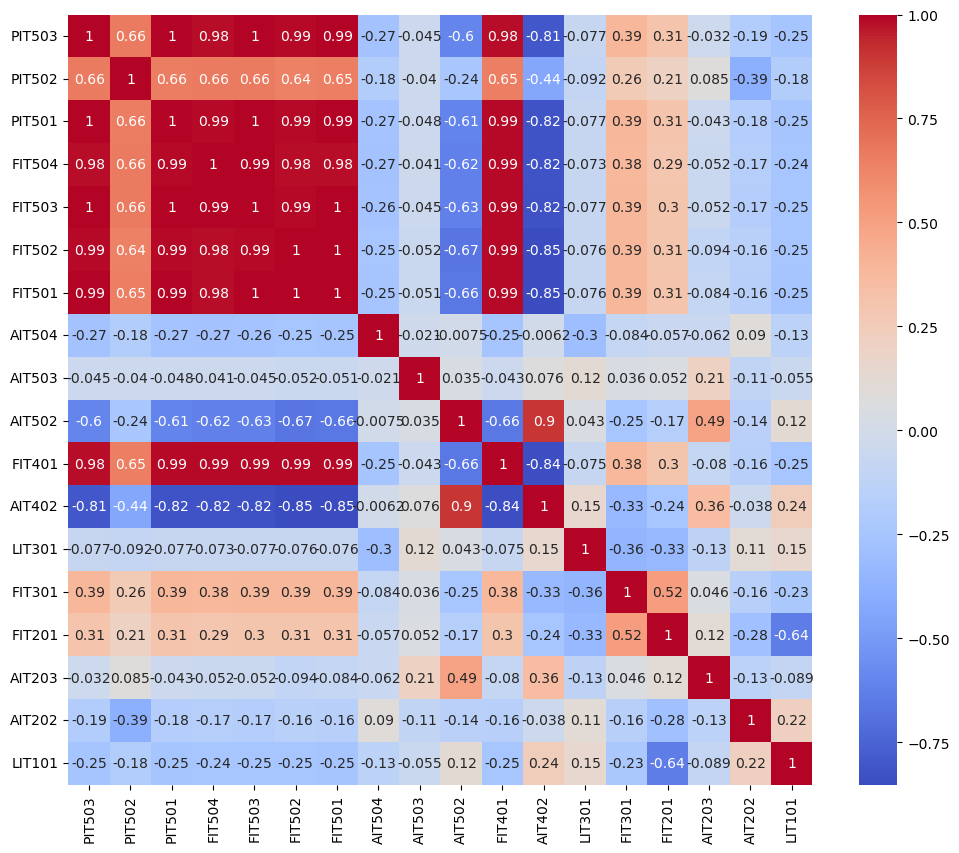

In [55]:
correlation_matrix = new_df.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In [58]:
correlation_matrix

,PIT503,PIT502,PIT501,FIT504,FIT503,FIT502,FIT501,AIT504,AIT503,AIT502,FIT401,AIT402,LIT301,FIT301,FIT201,AIT203,AIT202,LIT101
PIT503,1.000000,0.660191,0.999688,0.983718,0.996814,0.988201,0.993284,-0.266955,-0.044895,-0.600205,0.983780,-0.807908,-0.076954,0.390721,0.306388,-0.031750,-0.188179,-0.254729
PIT502,0.660191,1.000000,0.656796,0.660657,0.660697,0.643321,0.649852,-0.184595,-0.040312,-0.240080,0.651312,-0.435764,-0.091874,0.255128,0.210175,0.085356,-0.385824,-0.180666
PIT501,0.999688,0.656796,1.000000,0.986941,0.998288,0.990246,0.994949,-0.265525,-0.047775,-0.613007,0.986414,-0.816413,-0.076515,0.390741,0.305853,-0.042526,-0.177915,-0.254100
FIT504,0.983718,0.660657,0.986941,1.000000,0.993976,0.979852,0.983988,-0.268570,-0.040512,-0.623451,0.986147,-0.816407,-0.073297,0.382242,0.294305,-0.052103,-0.168397,-0.244871
FIT503,0.996814,0.660697,0.998288,0.993976,1.000000,0.991711,0.995870,-0.264948,-0.045079,-0.626716,0.990370,-0.824193,-0.076936,0.389853,0.302749,-0.052099,-0.174028,-0.251117
FIT502,0.988201,0.643321,0.990246,0.979852,0.991711,1.000000,0.997631,-0.251050,-0.051998,-0.673258,0.988508,-0.851720,-0.075779,0.390609,0.305572,-0.094007,-0.155620,-0.250869
FIT501,0.993284,0.649852,0.994949,0.983988,0.995870,0.997631,1.000000,-0.253962,-0.050758,-0.661834,0.989971,-0.845903,-0.076227,0.392117,0.306384,-0.084179,-0.162905,-0.252396
AIT504,-0.266955,-0.184595,-0.265525,-0.268570,-0.264948,-0.251050,-0.253962,1.000000,-0.021408,-0.007519,-0.251630,-0.006162,-0.299384,-0.083833,-0.056940,-0.061778,0.089913,-0.128711
AIT503,-0.044895,-0.040312,-0.047775,-0.040512,-0.045079,-0.051998,-0.050758,-0.021408,1.000000,0.035220,-0.043364,0.075586,0.118929,0.035819,0.051881,0.207106,-0.105964,-0.055062
AIT502,-0.600205,-0.240080,-0.613007,-0.623451,-0.626716,-0.673258,-0.661834,-0.007519,0.035220,1.000000,-0.659471,0.901137,0.043393,-0.247661,-0.168065,0.488787,-0.144626,0.122908


In [66]:
new_df['Target'].isnull()

Timestamp
2015-12-22 16:00:00    False
2015-12-22 16:00:01    False
2015-12-22 16:00:02    False
2015-12-22 16:00:03    False
2015-12-22 16:00:04    False
                       ...  
2016-01-02 14:59:55    False
2016-01-02 14:59:56    False
2016-01-02 14:59:57    False
2016-01-02 14:59:58    False
2016-01-02 14:59:59    False
Name: Target, Length: 946719, dtype: bool

before proceeding any furthur now, lets preprocess the data 

filling the null values with 0

In [71]:
df.fillna(0, inplace=True)

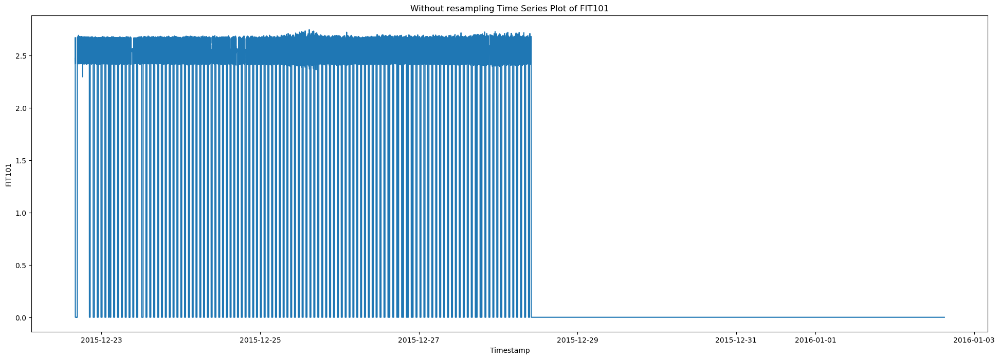

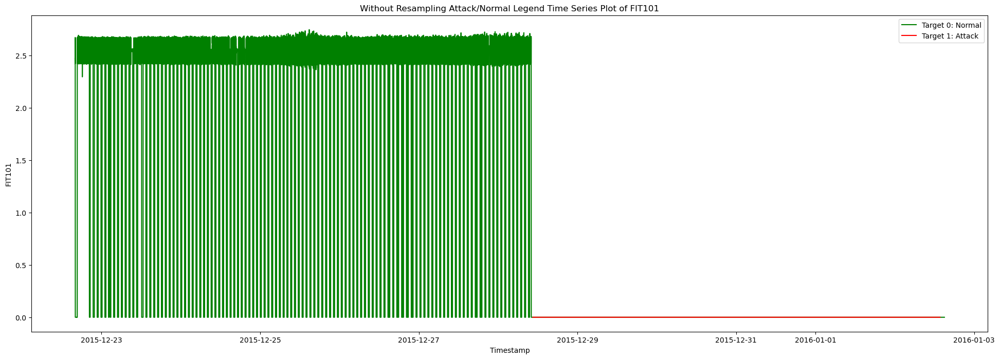

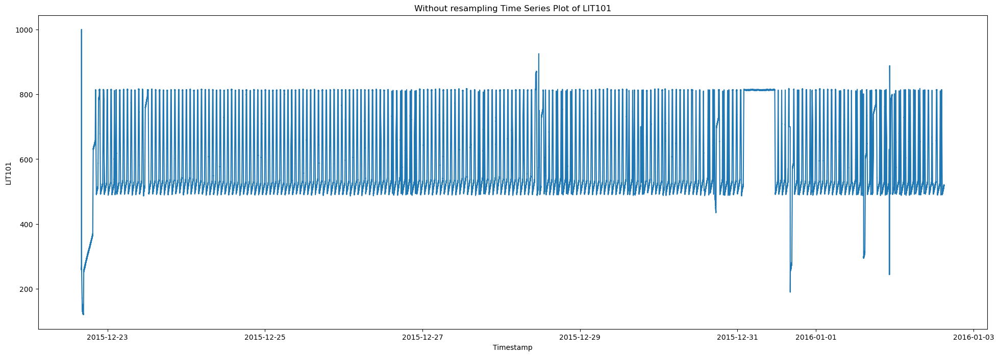

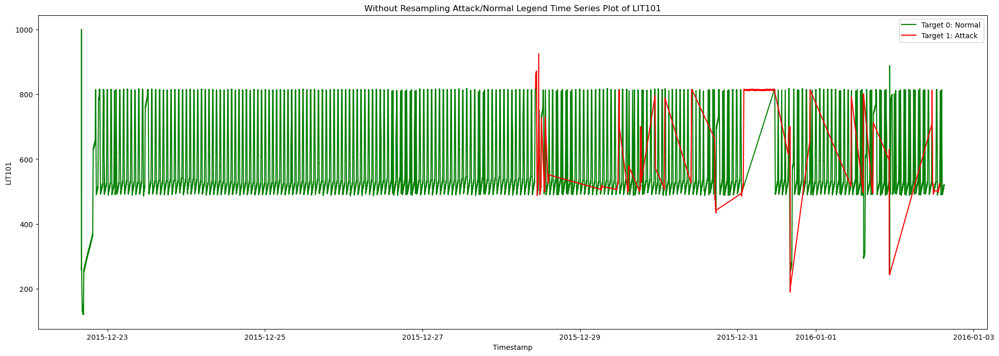

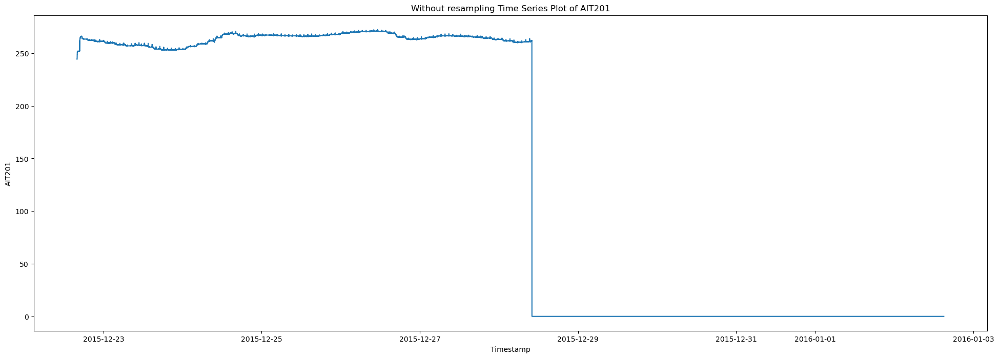

...

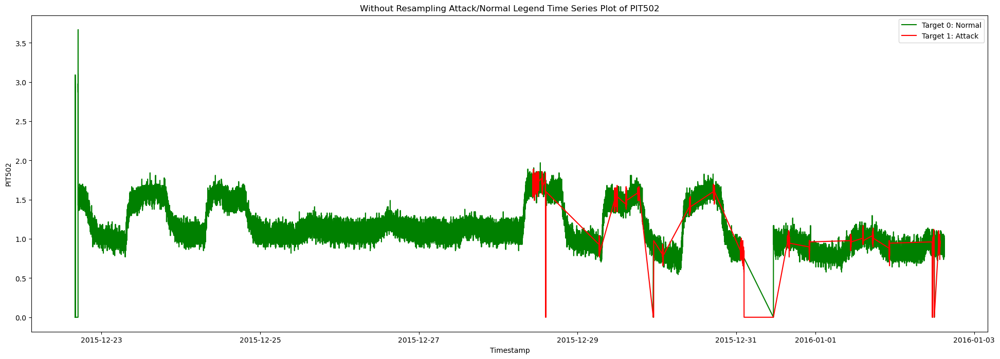

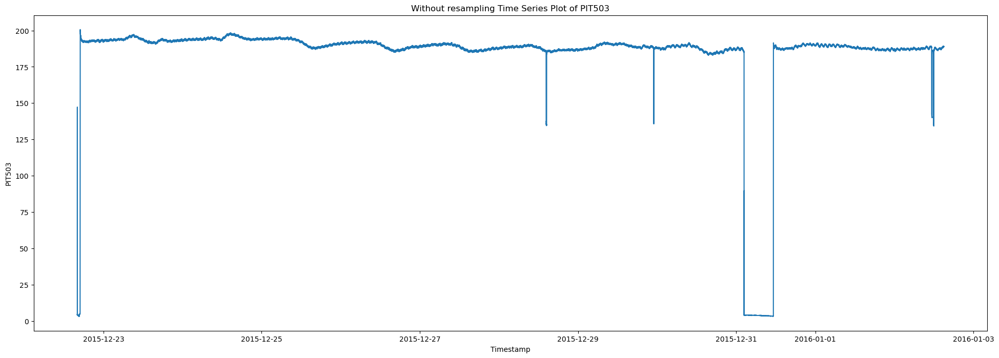

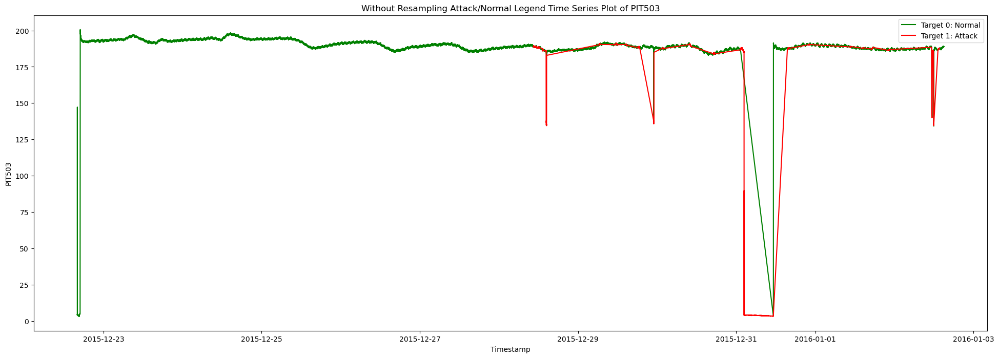

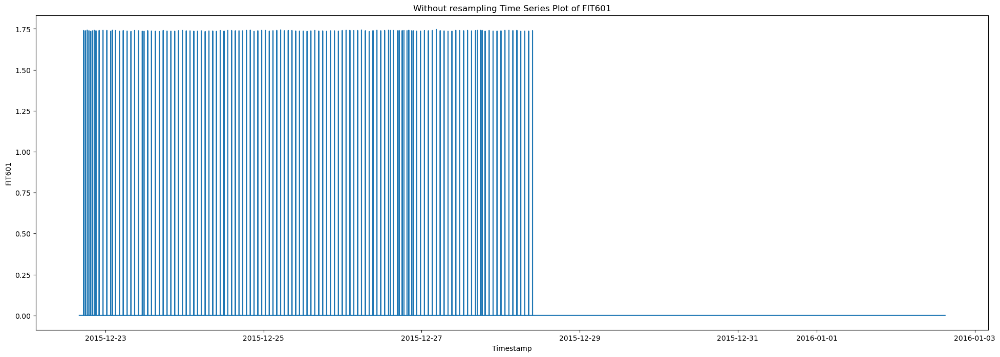

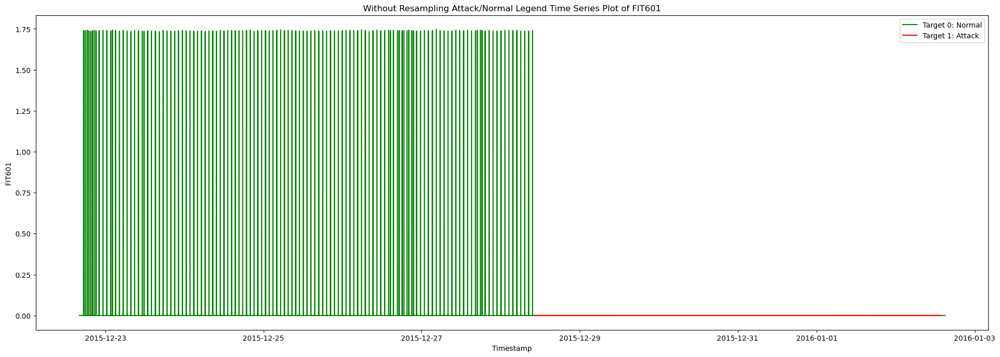

In [73]:
for i in sensors:
    function_plot(df, i)
    target_function_plot(df, i)

In [124]:
df.head()

,FIT101,LIT101,AIT201,AIT202,AIT203,FIT201,DPIT301,FIT301,LIT301,AIT401,...,AIT504,FIT501,FIT502,FIT503,FIT504,PIT501,PIT502,PIT503,FIT601,Target
Timestamp,,,,,,,,,,,,,,,,,,,,,
2015-12-22 16:00:00,2.470294,261.5804,244.3284,8.19008,306.101,2.471278,20.79839,2.235275,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:01,2.457163,261.1879,244.3284,8.19008,306.101,2.468587,20.79839,2.234507,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:02,2.439548,260.9131,244.3284,8.19008,306.101,2.467305,20.84320,2.233354,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:03,2.428338,260.2850,244.3284,8.19008,306.101,2.466536,20.84320,2.233354,327.2799,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:04,2.424815,259.8925,244.4245,8.19008,306.101,2.466536,20.84320,2.233354,327.1597,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0


In [125]:
new_df = df

In [126]:
new_df.head()

,FIT101,LIT101,AIT201,AIT202,AIT203,FIT201,DPIT301,FIT301,LIT301,AIT401,...,AIT504,FIT501,FIT502,FIT503,FIT504,PIT501,PIT502,PIT503,FIT601,Target
Timestamp,,,,,,,,,,,,,,,,,,,,,
2015-12-22 16:00:00,2.470294,261.5804,244.3284,8.19008,306.101,2.471278,20.79839,2.235275,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:01,2.457163,261.1879,244.3284,8.19008,306.101,2.468587,20.79839,2.234507,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:02,2.439548,260.9131,244.3284,8.19008,306.101,2.467305,20.84320,2.233354,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:03,2.428338,260.2850,244.3284,8.19008,306.101,2.466536,20.84320,2.233354,327.2799,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:04,2.424815,259.8925,244.4245,8.19008,306.101,2.466536,20.84320,2.233354,327.1597,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0


In [127]:

for i in new_df['Target']:
    if i== 'A ttack':
        print("IMPOSTER!!!!!")

IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!
IMPOSTER!!!!!


In [128]:
for i in range(len(new_df['Target'])):
    if new_df['Target'].iloc[i] == 'A ttack':
        new_df['Target'].iloc[i] = 1

In [130]:

for i in new_df['Target']:
    if i== 'A ttack':
        print("IMPOSTER!!!!!")
print("No imposter found")

No imposter found


In [131]:
new_df.head()

,FIT101,LIT101,AIT201,AIT202,AIT203,FIT201,DPIT301,FIT301,LIT301,AIT401,...,AIT504,FIT501,FIT502,FIT503,FIT504,PIT501,PIT502,PIT503,FIT601,Target
Timestamp,,,,,,,,,,,,,,,,,,,,,
2015-12-22 16:00:00,2.470294,261.5804,244.3284,8.19008,306.101,2.471278,20.79839,2.235275,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:01,2.457163,261.1879,244.3284,8.19008,306.101,2.468587,20.79839,2.234507,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:02,2.439548,260.9131,244.3284,8.19008,306.101,2.467305,20.84320,2.233354,327.4401,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:03,2.428338,260.2850,244.3284,8.19008,306.101,2.466536,20.84320,2.233354,327.2799,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0
2015-12-22 16:00:04,2.424815,259.8925,244.4245,8.19008,306.101,2.466536,20.84320,2.233354,327.1597,0.0,...,12.68905,0.001666,0.001409,0.001664,0.0,10.02948,0.0,4.277749,0.000256,0


In [139]:
new_df['Target'] = new_df['Target'].astype(np.float64)

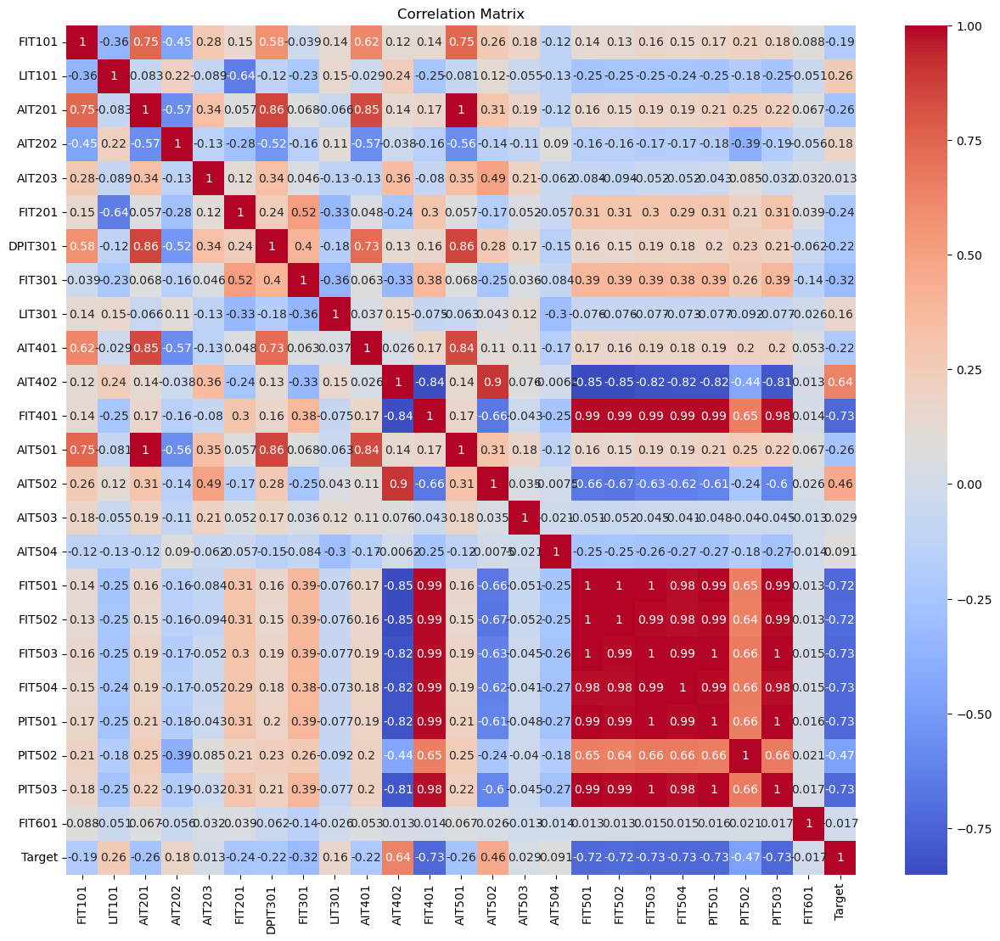

In [144]:
correlation_matrix = new_df.corr()

plt.figure(figsize=(15, 13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

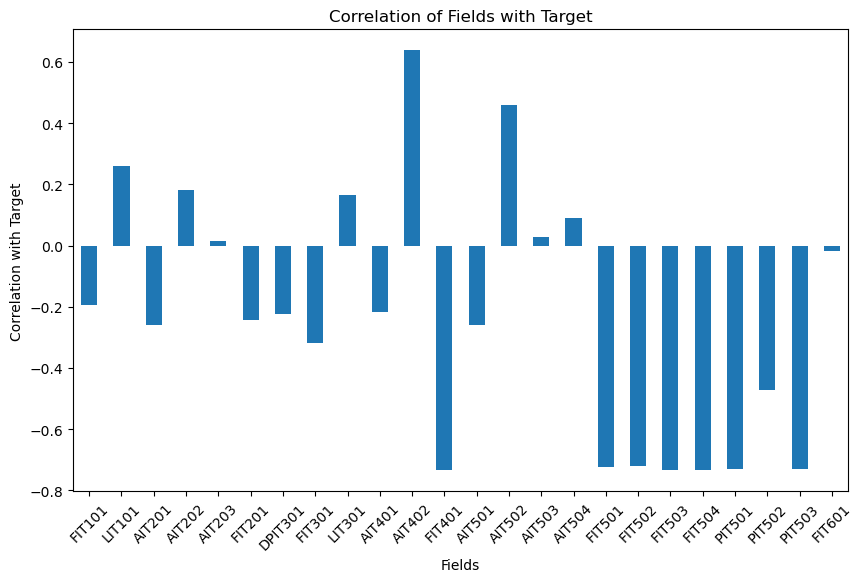

In [145]:
# Plot bar graph of correlation with 'Target'
target_corr = correlation_matrix['Target'].drop('Target')
plt.figure(figsize=(10, 6))
target_corr.plot(kind='bar')
plt.xlabel('Fields')
plt.ylabel('Correlation with Target')
plt.title('Correlation of Fields with Target')
plt.xticks(rotation=45)
plt.show()

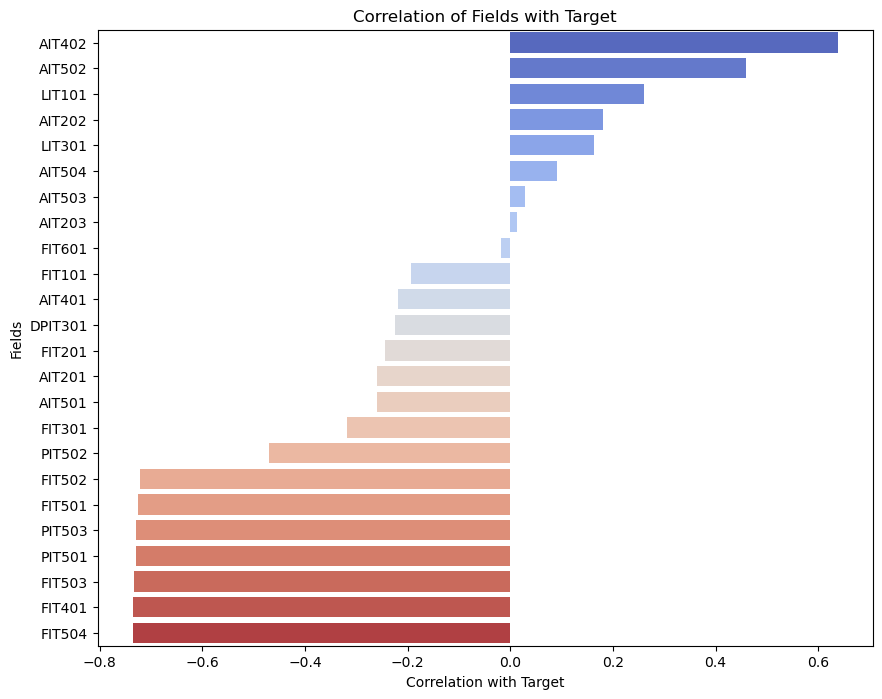

In [146]:
# Compute correlation matrix
correlation_matrix = new_df.corr()

# Extract correlation of each field with 'Target'
target_corr = correlation_matrix['Target'].drop('Target')

# Sort correlation values in descending order
target_corr_sorted = target_corr.sort_values(ascending=False)

# Create horizontal bar plot
plt.figure(figsize=(10, 8))
sns.barplot(x=target_corr_sorted.values, y=target_corr_sorted.index, palette='coolwarm')

plt.xlabel('Correlation with Target')
plt.ylabel('Fields')
plt.title('Correlation of Fields with Target')
plt.show()

In [156]:
positive_correlated_columns = target_corr_sorted[target_corr_sorted > 0].index.values
print(positive_correlated_columns)


['AIT402' 'AIT502' 'LIT101' 'AIT202' 'LIT301' 'AIT504' 'AIT503' 'AIT203']


## so this completes the feature selection

In [158]:
#creating a new dataframe with the selected features 

In [167]:
# Remove the "Target" suffix from column names
positive_columns = [col.replace('Target', '') for col in positive_correlated_columns]

# Create main_df with positive correlated columns and Target column
main_df = new_df[positive_columns + ['Target']]


In [168]:
main_df.head()

,AIT402,AIT502,LIT101,AIT202,LIT301,AIT504,AIT503,AIT203,Target
Timestamp,,,,,,,,,
2015-12-22 16:00:00,171.0587,176.8265,261.5804,8.19008,327.4401,12.68905,263.6504,306.101,0.0
2015-12-22 16:00:01,171.0587,176.8008,261.1879,8.19008,327.4401,12.68905,263.6504,306.101,0.0
2015-12-22 16:00:02,171.0587,176.8008,260.9131,8.19008,327.4401,12.68905,263.6504,306.101,0.0
2015-12-22 16:00:03,171.0587,176.8008,260.2850,8.19008,327.2799,12.68905,263.6504,306.101,0.0
2015-12-22 16:00:04,171.0587,176.8008,259.8925,8.19008,327.1597,12.68905,263.6504,306.101,0.0


In [171]:
features = positive_columns

## So these are those 8 features and their maps

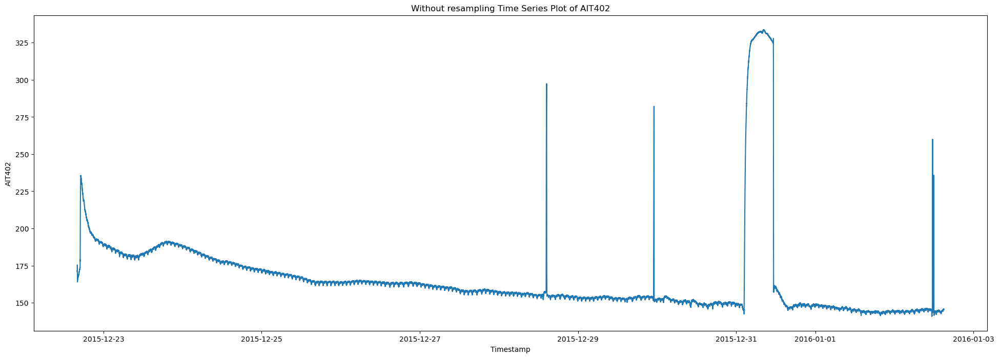

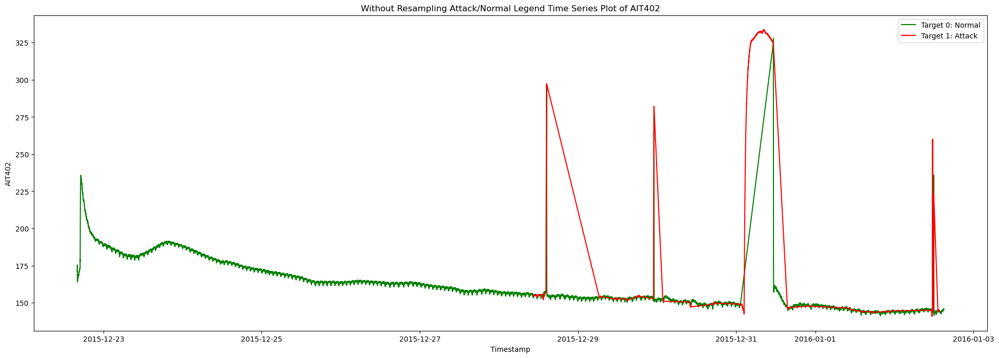

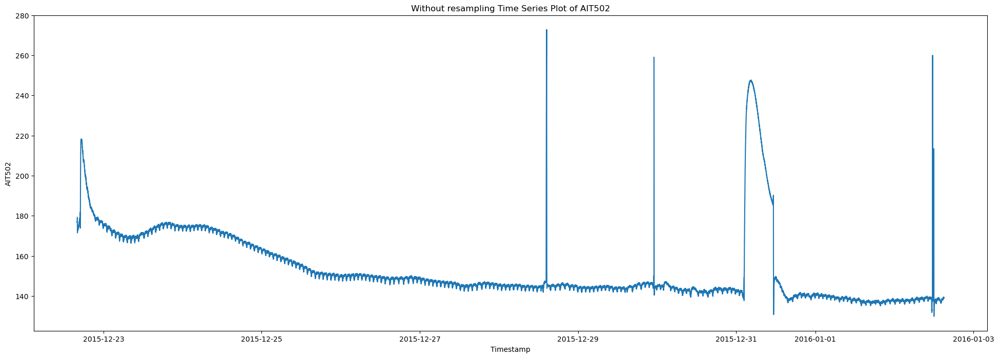

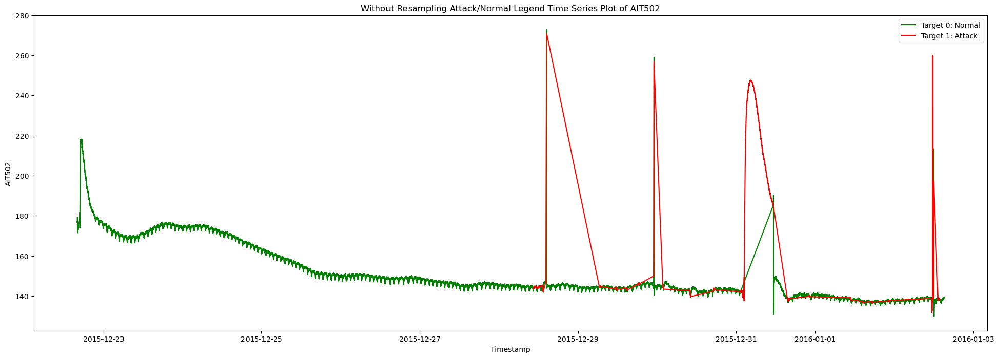

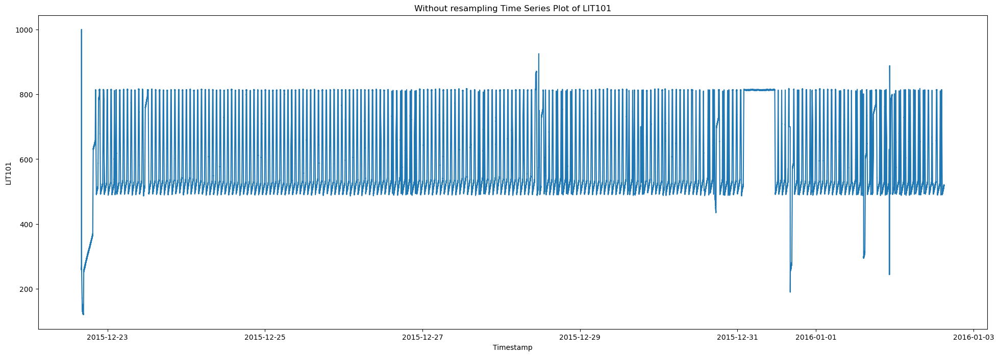

...

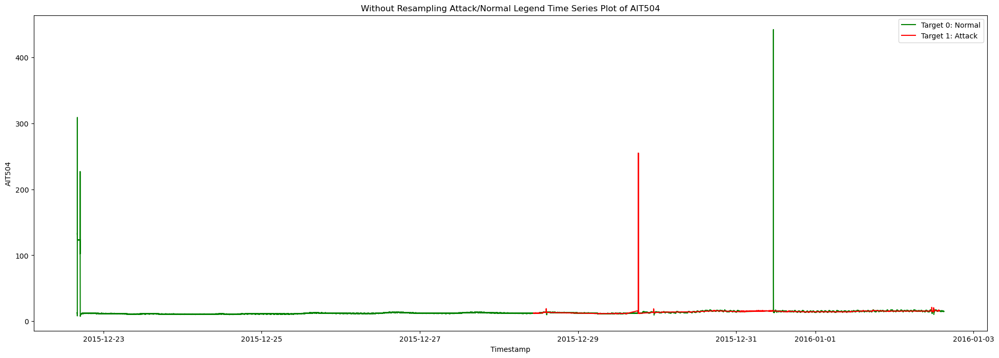

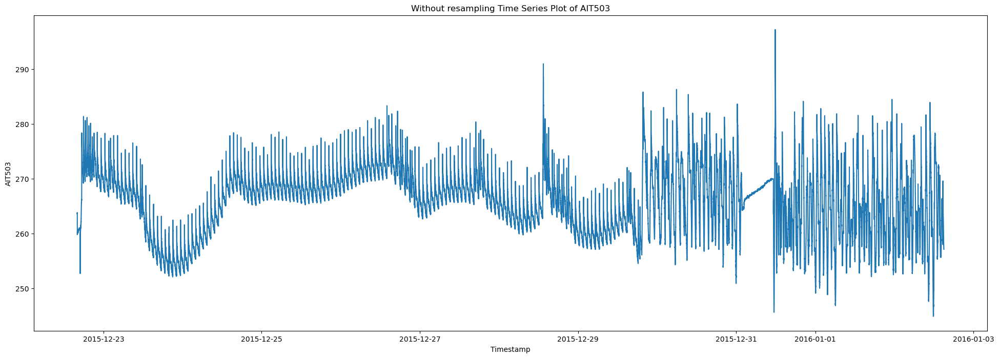

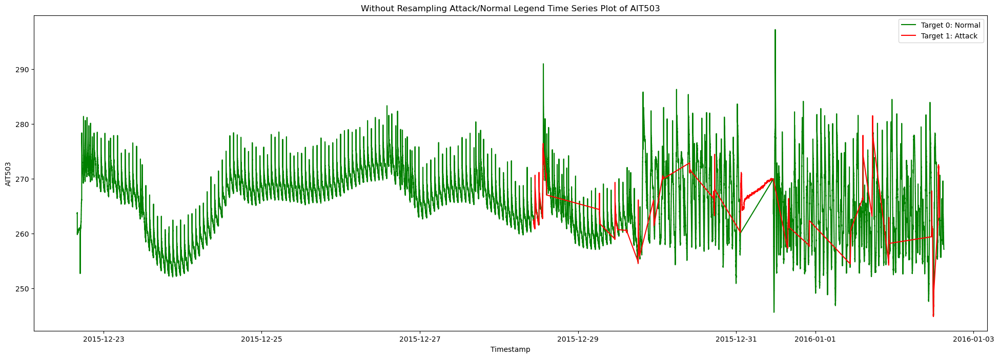

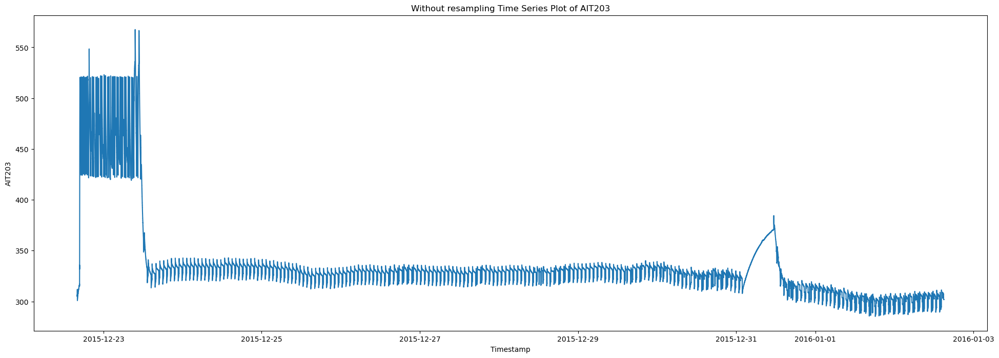

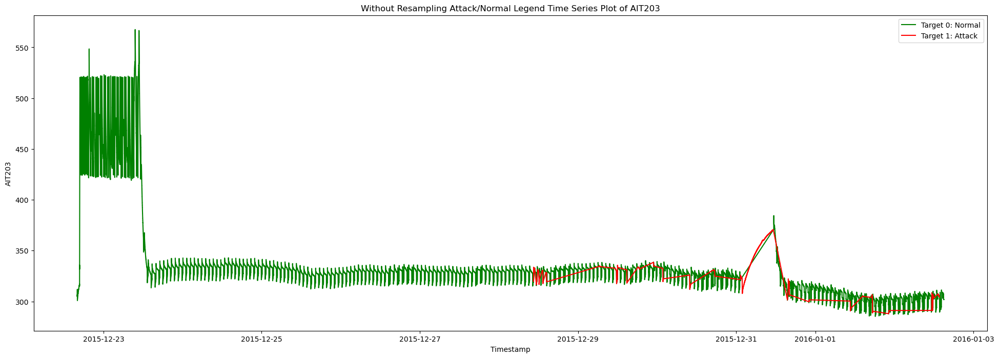

In [172]:
for i in features:
    function_plot(main_df, i)
    target_function_plot(main_df, i)

In [173]:
main_df.head()

,AIT402,AIT502,LIT101,AIT202,LIT301,AIT504,AIT503,AIT203,Target
Timestamp,,,,,,,,,
2015-12-22 16:00:00,171.0587,176.8265,261.5804,8.19008,327.4401,12.68905,263.6504,306.101,0.0
2015-12-22 16:00:01,171.0587,176.8008,261.1879,8.19008,327.4401,12.68905,263.6504,306.101,0.0
2015-12-22 16:00:02,171.0587,176.8008,260.9131,8.19008,327.4401,12.68905,263.6504,306.101,0.0
2015-12-22 16:00:03,171.0587,176.8008,260.2850,8.19008,327.2799,12.68905,263.6504,306.101,0.0
2015-12-22 16:00:04,171.0587,176.8008,259.8925,8.19008,327.1597,12.68905,263.6504,306.101,0.0


### proceeding with the training part

In [174]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 946719 entries, 2015-12-22 16:00:00 to 2016-01-02 14:59:59
Data columns (total 9 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   AIT402  946719 non-null  float64
 1   AIT502  946719 non-null  float64
 2   LIT101  946719 non-null  float64
 3   AIT202  946719 non-null  float64
 4   LIT301  946719 non-null  float64
 5   AIT504  946719 non-null  float64
 6   AIT503  946719 non-null  float64
 7   AIT203  946719 non-null  float64
 8   Target  946719 non-null  float64
dtypes: float64(9)
memory usage: 72.2 MB


In [175]:
main_df['Target'] = main_df['Target'].astype(int)


In [177]:
from sklearn.model_selection import train_test_split

# Split the data into train and test datasets
X = main_df.drop('Target', axis=1)  # Features (input variables)
y = main_df['Target']  # Target variable

# Split the data into 80% train and 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [178]:
# logistic regresion
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()


In [179]:
logreg.fit(X_train, y_train)


LogisticRegression()

In [180]:
y_pred = logreg.predict(X_test)


In [181]:
from sklearn.metrics import accuracy_score, classification_report

accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Accuracy:", accuracy)
print("Classification Report:")
print(report)


Accuracy: 0.9743429947608585
Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99    178370
           1       1.00      0.56      0.72     10974

    accuracy                           0.97    189344
   macro avg       0.98      0.78      0.85    189344
weighted avg       0.97      0.97      0.97    189344



Decision Tree

In [182]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier()


In [183]:
dt.fit(X_train, y_train)


DecisionTreeClassifier()

In [184]:
y_pred = dt.predict(X_test)


In [185]:
from sklearn.metrics import accuracy_score, classification_report

accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Accuracy:", accuracy)
print("Classification Report:")
print(report)


Accuracy: 0.9997148047997296
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    178370
           1       1.00      1.00      1.00     10974

    accuracy                           1.00    189344
   macro avg       1.00      1.00      1.00    189344
weighted avg       1.00      1.00      1.00    189344



using the random forest classifier

In [186]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()


In [187]:
rf.fit(X_train, y_train)


RandomForestClassifier()

In [188]:
y_pred = rf.predict(X_test)


In [189]:
from sklearn.metrics import accuracy_score, classification_report

accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Accuracy:", accuracy)
print("Classification Report:")
print(report)


Accuracy: 0.9999049349332432
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    178370
           1       1.00      1.00      1.00     10974

    accuracy                           1.00    189344
   macro avg       1.00      1.00      1.00    189344
weighted avg       1.00      1.00      1.00    189344



using SVM

In [190]:
from sklearn.svm import SVC

svm = SVC()


In [191]:
svm.fit(X_train, y_train)


SVC()

In [192]:
y_pred = svm.predict(X_test)
from sklearn.metrics import accuracy_score, classification_report

accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Accuracy:", accuracy)
print("Classification Report:")
print(report)


Accuracy: 0.9774114838600643
Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    178370
           1       0.99      0.62      0.76     10974

    accuracy                           0.98    189344
   macro avg       0.98      0.81      0.87    189344
weighted avg       0.98      0.98      0.97    189344



using naive bayes

In [193]:
from sklearn.naive_bayes import GaussianNB

naive_bayes = GaussianNB()


In [194]:
naive_bayes.fit(X_train, y_train)


GaussianNB()

In [195]:
y_pred = naive_bayes.predict(X_test)


In [196]:
from sklearn.metrics import accuracy_score, classification_report

accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print("Accuracy:", accuracy)
print("Classification Report:")
print(report)


Accuracy: 0.9714804799729593
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99    178370
           1       0.87      0.60      0.71     10974

    accuracy                           0.97    189344
   macro avg       0.92      0.80      0.85    189344
weighted avg       0.97      0.97      0.97    189344



using CNN

In [199]:
pip install tensorflow

     -------------------------------------- 272.8/272.8 MB 7.6 MB/s eta 0:00:00
  Using cached absl_py-1.4.0-py3-none-any.whl (126 kB)
  Using cached tensorflow_estimator-2.12.0-py2.py3-none-any.whl (440 kB)
  Using cached libclang-16.0.0-py2.py3-none-win_amd64.whl (24.4 MB)
  Using cached gast-0.4.0-py3-none-any.whl (9.8 kB)
     ---------------------------------------- 1.5/1.5 MB 15.7 MB/s eta 0:00:00
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached termcolor-2.3.0-py3-none-any.whl (6.9 kB)
     ------------------------------------- 422.5/422.5 kB 27.5 MB/s eta 0:00:00
  Using cached keras-2.12.0-py2.py3-none-any.whl (1.7 MB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl (65 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
     ---------------------------------------- 5.6/5.6 MB 14.4 MB/s eta 0:00:00
     ---------------------------------------- 4.1/4.1 MB 15.4 MB/s eta 0:00:00
     ---------------------------------------- 1.3/1.3 MB 13.8 M

In [200]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense


In [211]:
epochs = 10
batch_size = 32
height = 8
width = 1
channels = 1
input_shape = (height, width, channels)

In [204]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)

X_train shape: (757375, 8)
X_test shape: (189344, 8)


In [208]:
input_shape = (8, 1, 1)

# CNN model architecture
model = Sequential()
model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(units=128, activation='relu'))
model.add(Dense(units=num_classes, activation='softmax'))

# Compile and train the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, batch_size=32, epochs=10, validation_data=(X_test, y_test))


ValueError: One of the dimensions in the output is <= 0 due to downsampling in conv2d_1. Consider increasing the input size. Received input shape [None, 8, 1, 1] which would produce output shape with a zero or negative value in a dimension.

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test))


In [ ]:
loss, accuracy = model.evaluate(X_test, y_test)
print("Loss:", loss)
print("Accuracy:", accuracy)


In [ ]:
import matplotlib.pyplot as plt

# Train the model and obtain the history object
history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test))

# Get the training and validation accuracy values
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Get the training and validation loss values
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the accuracy graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs+1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, epochs+1), val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the loss graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs+1), train_loss, label='Training Loss')
plt.plot(range(1, epochs+1), val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


since the data is not in the form images of 2D array,  need to check on this

using lstm model

In [212]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

model = Sequential()
model.add(LSTM(32, input_shape=(8, 1)))  # Adjust the number of units in the LSTM layer as needed
model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation for binary classification

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [213]:
model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test))

Epoch 1/10
23668/23668 [==============================] - 99s 4ms/step - loss: 0.1513 - accuracy: 0.9556 - val_loss: 0.1045 - val_accuracy: 0.9758
Epoch 2/10
23668/23668 [==============================] - 102s 4ms/step - loss: 0.1046 - accuracy: 0.9743 - val_loss: 0.0998 - val_accuracy: 0.9763
Epoch 3/10
23668/23668 [==============================] - 107s 5ms/step - loss: 0.0992 - accuracy: 0.9763 - val_loss: 0.0981 - val_accuracy: 0.9761
Epoch 4/10
23668/23668 [==============================] - 96s 4ms/step - loss: 0.0971 - accuracy: 0.9770 - val_loss: 0.0944 - val_accuracy: 0.9778
Epoch 5/10
23668/23668 [==============================] - 106s 4ms/step - loss: 0.0962 - accuracy: 0.9772 - val_loss: 0.0996 - val_accuracy: 0.9760
Epoch 6/10
23668/23668 [==============================] - 108s 5ms/step - loss: 0.0956 - accuracy: 0.9774 - val_loss: 0.0989 - val_accuracy: 0.9774
Epoch 7/10
23668/23668 [==============================] - 99s 4ms/step - loss: 0.0948 - accuracy: 0.9775 - val_los

In [214]:
loss, accuracy = model.evaluate(X_test, y_test)
print("Loss:", loss)
print("Accuracy:", accuracy)


5917/5917 [==============================] - 12s 2ms/step - loss: 0.0903 - accuracy: 0.9786
Loss: 0.0903104692697525
Accuracy: 0.9786050915718079


Epoch 1/10
23668/23668 [==============================] - 96s 4ms/step - loss: 0.0921 - accuracy: 0.9781 - val_loss: 0.0936 - val_accuracy: 0.9784
Epoch 2/10
23668/23668 [==============================] - 95s 4ms/step - loss: 0.0917 - accuracy: 0.9782 - val_loss: 0.0934 - val_accuracy: 0.9781
Epoch 3/10
23668/23668 [==============================] - 96s 4ms/step - loss: 0.0928 - accuracy: 0.9779 - val_loss: 0.1077 - val_accuracy: 0.9754
Epoch 4/10
23668/23668 [==============================] - 100s 4ms/step - loss: 0.0936 - accuracy: 0.9778 - val_loss: 0.1030 - val_accuracy: 0.9762
Epoch 5/10
23668/23668 [==============================] - 109s 5ms/step - loss: 0.0929 - accuracy: 0.9780 - val_loss: 0.0909 - val_accuracy: 0.9780
Epoch 6/10
23668/23668 [==============================] - 108s 5ms/step - loss: 0.0921 - accuracy: 0.9781 - val_loss: 0.0903 - val_accuracy: 0.9779
Epoch 7/10
23668/23668 [==============================] - 105s 4ms/step - loss: 0.0885 - accuracy: 0.9784 - val_los

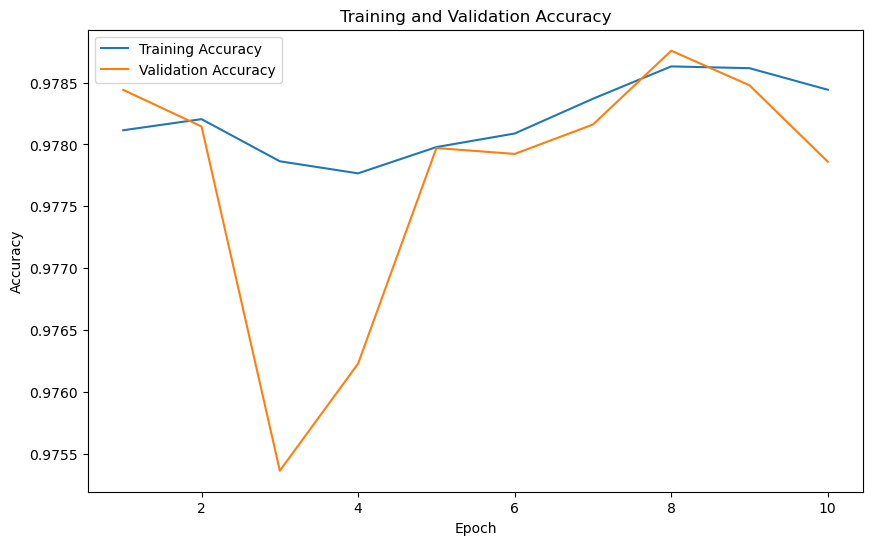

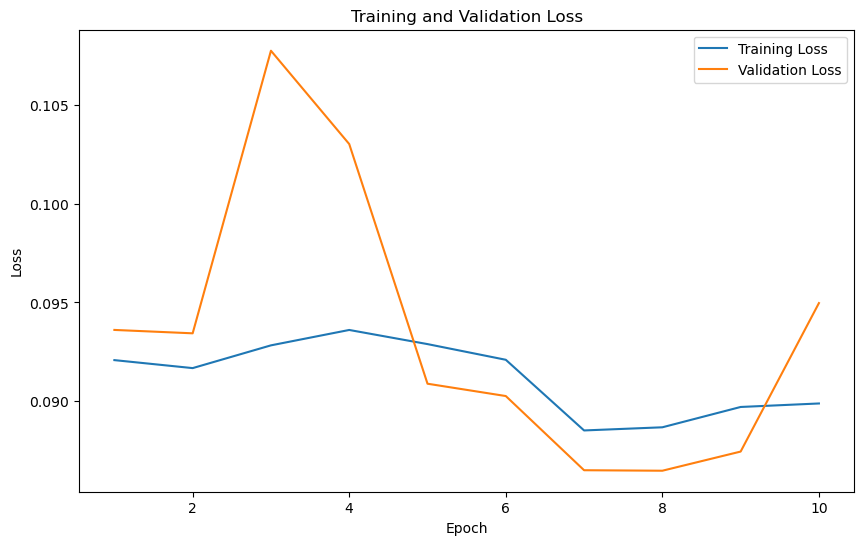

In [216]:
# Train the model and obtain the history object
history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test))

# Get the training and validation accuracy values
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Get the training and validation loss values
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the accuracy graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs+1), train_accuracy, label='Training Accuracy')
plt.plot(range(1, epochs+1), val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the loss graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs+1), train_loss, label='Training Loss')
plt.plot(range(1, epochs+1), val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


using RNN

In [217]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split

# Assuming you have preprocessed input data X and target data y

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Pad sequences if needed
X_train = pad_sequences(X_train)
X_test = pad_sequences(X_test)

# Build the RNN model
model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_seq_length))
model.add(LSTM(units=128))
model.add(Dense(units=1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

history = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(X_test, y_test))

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test Loss: {loss:.4f}')
print(f'Test Accuracy: {accuracy:.4f}')


ValueError: invalid literal for int() with base 10: 'AIT402'

In [ ]:

# Train the model and store the history
# history = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(X_test, y_test))

# Plot the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


using ensemble boosting

using AdaBoost

In [218]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score


In [219]:
adaboost = AdaBoostClassifier()


In [220]:
adaboost.fit(X_train, y_train)


AdaBoostClassifier()

In [221]:
y_pred = adaboost.predict(X_test)


In [222]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.9800733057292547


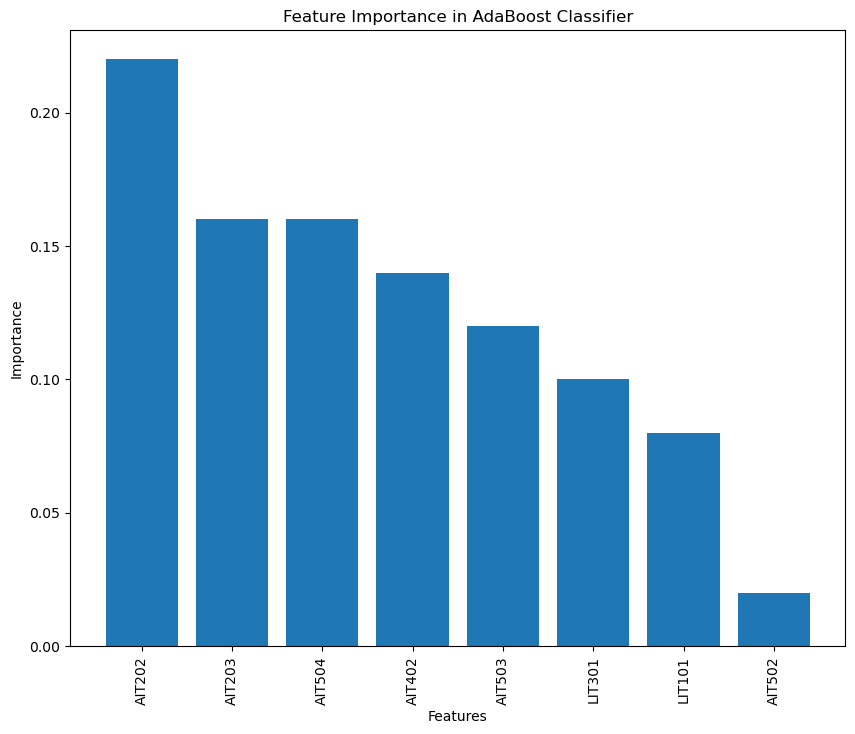

In [223]:
# Get feature importances
importances = adaboost.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Plot feature importances
plt.figure(figsize=(10, 8))
plt.bar(range(X_train.shape[1]), importances[indices])
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance in AdaBoost Classifier')
plt.show()


gradient boosting 

In [224]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score


In [225]:
gradient_boosting = GradientBoostingClassifier()


In [226]:
gradient_boosting.fit(X_train, y_train)


GradientBoostingClassifier()

In [227]:
y_pred = gradient_boosting.predict(X_test)


In [228]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.9875095065066757


In [230]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)


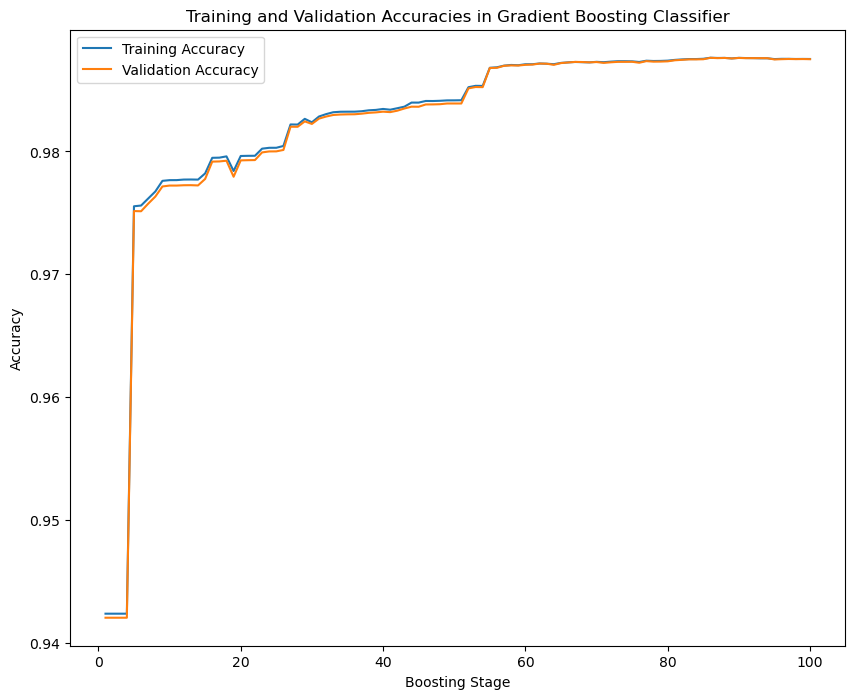

In [231]:
# Initialize lists to store training and validation accuracies
train_accuracies = []
val_accuracies = []

# Iterate over each stage of the boosting process
for y_pred_train in gradient_boosting.staged_predict(X_train):
    train_accuracy = accuracy_score(y_train, y_pred_train)
    train_accuracies.append(train_accuracy)

for y_pred_val in gradient_boosting.staged_predict(X_val):
    val_accuracy = accuracy_score(y_val, y_pred_val)
    val_accuracies.append(val_accuracy)

# Plot the training and validation accuracies
plt.figure(figsize=(10, 8))
plt.plot(range(1, len(train_accuracies) + 1), train_accuracies, label='Training Accuracy')
plt.plot(range(1, len(val_accuracies) + 1), val_accuracies, label='Validation Accuracy')
plt.xlabel('Boosting Stage')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracies in Gradient Boosting Classifier')
plt.legend()
plt.show()
